In [9]:
# standard
import numpy as np
import pandas as pd
import os
import time
# plots
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import plotly.express as px
import seaborn as sns
import plotly.express as px
import cv2
import pydicom as dicom # dicom
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut
import warnings # warning handling
warnings.filterwarnings('ignore')
import glob
import json
import collections





In [43]:

df_train_label = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')
df_train_desc = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv')
df_train_main = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/train.csv')
df_sub = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')
df_test_desc = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/test_series_descriptions.csv')


In [4]:
df_train_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1975 entries, 0 to 1974
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   study_id                                1975 non-null   int64 
 1   spinal_canal_stenosis_l1_l2             1974 non-null   object
 2   spinal_canal_stenosis_l2_l3             1974 non-null   object
 3   spinal_canal_stenosis_l3_l4             1974 non-null   object
 4   spinal_canal_stenosis_l4_l5             1974 non-null   object
 5   spinal_canal_stenosis_l5_s1             1974 non-null   object
 6   left_neural_foraminal_narrowing_l1_l2   1973 non-null   object
 7   left_neural_foraminal_narrowing_l2_l3   1973 non-null   object
 8   left_neural_foraminal_narrowing_l3_l4   1973 non-null   object
 9   left_neural_foraminal_narrowing_l4_l5   1973 non-null   object
 10  left_neural_foraminal_narrowing_l5_s1   1973 non-null   object
 11  righ

In [5]:
print("Total Cases: ", len(df_train_main))

Total Cases:  1975


In [6]:
df_train_main.head(3)

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1,4646740,Normal/Mild,Normal/Mild,Moderate,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate,Normal/Mild
2,7143189,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild


In [7]:
df_train_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48692 entries, 0 to 48691
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   study_id         48692 non-null  int64  
 1   series_id        48692 non-null  int64  
 2   instance_number  48692 non-null  int64  
 3   condition        48692 non-null  object 
 4   level            48692 non-null  object 
 5   x                48692 non-null  float64
 6   y                48692 non-null  float64
dtypes: float64(2), int64(3), object(2)
memory usage: 2.6+ MB


In [8]:
df_train_label.head(3)

,study_id,series_id,instance_number,condition,level,x,y
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182


In [10]:
columns_to_analyze = ['instance_number', 'condition', 'level']

# Iterate over the columns and print their value counts
for column in columns_to_analyze:
    print(df_train_label[column].value_counts())
    print('-' * 50)
    print()

instance_number
8      3615
11     3517
10     3396
5      3288
12     3180
       ... 
118       1
96        1
73        1
83        1
117       1
Name: count, Length: 101, dtype: int64
--------------------------------------------------

condition
Left Neural Foraminal Narrowing     9860
Right Neural Foraminal Narrowing    9859
Spinal Canal Stenosis               9753
Right Subarticular Stenosis         9612
Left Subarticular Stenosis          9608
Name: count, dtype: int64
--------------------------------------------------

level
L3/L4    9858
L4/L5    9858
L5/S1    9845
L2/L3    9661
L1/L2    9470
Name: count, dtype: int64
--------------------------------------------------



In [11]:
pd.crosstab(df_train_label.condition, df_train_label.level)

level,L1/L2,L2/L3,L3/L4,L4/L5,L5/S1
condition,,,,,
Left Neural Foraminal Narrowing,1972,1972,1972,1972,1972
Left Subarticular Stenosis,1810,1892,1971,1971,1964
Right Neural Foraminal Narrowing,1972,1972,1971,1972,1972
Right Subarticular Stenosis,1812,1891,1971,1971,1967
Spinal Canal Stenosis,1904,1934,1973,1972,1970


In [15]:
# join first two tables
df_train_step_1 = pd.merge(left=df_train_label, right=df_train_main, how='left', on='study_id').reset_index(drop=True)
df_train_step_1.head()

# join with third table


,study_id,series_id,instance_number,condition,level,x,y,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild


In [14]:
df_train = pd.merge(left=df_train_step_1, right=df_train_desc, how='left', on=['study_id', 'series_id']).reset_index(drop=True)
df_train.head()



,study_id,series_id,instance_number,condition,level,x,y,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,...,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1,series_description
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR


In [13]:
# convert study_id's to categorical
df_train.study_id = df_train.study_id.astype('category')
df_train.series_id = df_train.series_id.astype('category')
df_train.head()

,study_id,series_id,instance_number,condition,level,x,y,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,...,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1,series_description
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR


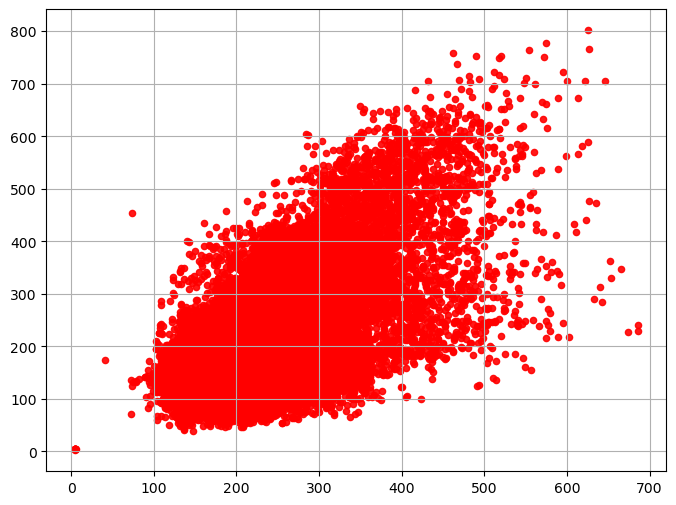

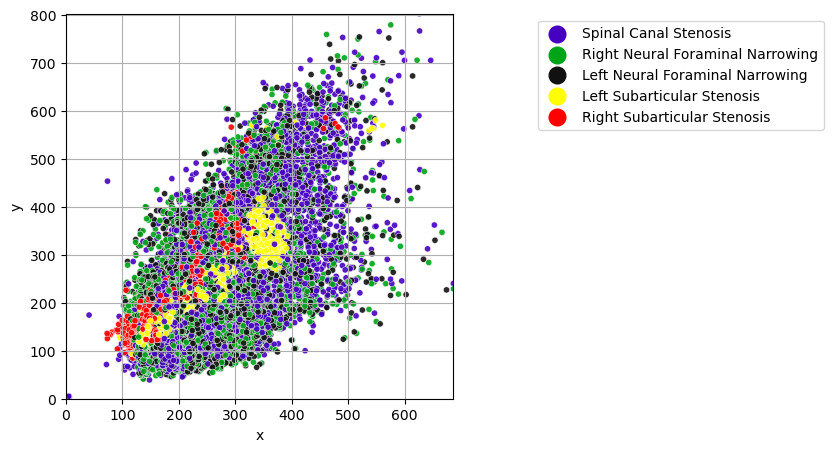

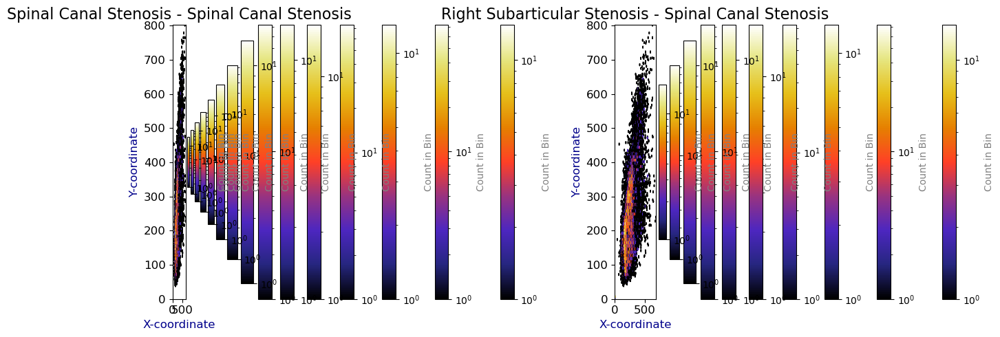

In [18]:
def plot_scatter(x_data, y_data, color='red', marker_size=20, alpha=0.9):

    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, color=color, s=marker_size, alpha=alpha)
    plt.grid(True)
    plt.show()
plot_scatter(df_train['x'], df_train['y'])

def plot_categorical_scatter(data, x, y, hue, palette_colors, fig_size=(5, 5), marker_size=20, alpha_value=0.9):

    plt.figure(figsize=fig_size)
    sns.scatterplot(data=data, x=x, y=y, hue=hue, palette=palette_colors, s=marker_size, alpha=alpha_value)
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, prop={'size': 10}, markerscale=2, framealpha=0.8, facecolor='white')
    plt.grid(True)
    plt.xlim([0, data[x].max()])
    plt.ylim([0, data[y].max()])
    plt.show()

palette_colors = ['#4600c0', '#00a419', '#111111', '#ffff00', '#ff0000']
plot_categorical_scatter(df_train, 'x', 'y', 'condition', palette_colors)

import matplotlib.pyplot as plt

def plot_hexbin_categorical(data, x_col, y_col, condition_col, numerical_features, grid_size=150, num_columns=2, 
                            fig_width=13, fig_height=5, xy_label_color='darkblue', xy_label_size=12, 
                            title_size=16):

    fig, axes = plt.subplots(1, num_columns, figsize=(fig_width, fig_height))
    
    # Iterate through numerical features
    for i, feature in enumerate(numerical_features):
        # Get data for the current feature
        for condition, d in data.groupby(condition_col):
            ax = axes[i % num_columns]
            hb = ax.hexbin(x=d[x_col], y=d[y_col], gridsize=grid_size, cmap='CMRmap', bins='log', alpha=1)
            cb = plt.colorbar(hb, ax=ax)
            cb.set_label('Count in Bin', size=10, color='grey')
            ax.set_xlabel('X-coordinate', fontsize=xy_label_size, color=xy_label_color)
            ax.set_ylabel('Y-coordinate', fontsize=xy_label_size, color=xy_label_color)
            ax.set_title(f"{feature} - {condition}", color='black', fontsize=title_size)
            ax.tick_params(axis='x', labelsize=xy_label_size)
            ax.tick_params(axis='y', labelsize=xy_label_size)
            ax.set_xlim([0, data[x_col].max()])
            ax.set_ylim([0, data[y_col].max()])
    
    plt.tight_layout()
    plt.show()

numerical_features = ['Left Neural Foraminal Narrowing', 'Right Neural Foraminal Narrowing',
                      'Left Subarticular Stenosis', 'Right Subarticular Stenosis', 'Spinal Canal Stenosis']
plot_hexbin_categorical(df_train, 'x', 'y', 'condition', numerical_features)

In [ ]:
def plot_scatter_categorical(data, x_col, y_col, hue_col, palette_colors, marker_size=30, alpha_value=0.5,
                              legend_pos=(1.2, 1), legend_loc=2, legend_size=10, grid=True):

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x=x_col, y=y_col, hue=hue_col, palette=palette_colors,
                    s=marker_size, alpha=alpha_value)
    plt.legend(bbox_to_anchor=legend_pos, loc=legend_loc, prop={'size': legend_size},
               markerscale=2, framealpha=0.8, facecolor='white', edgecolor='black')
    plt.grid(grid)
    plt.xlim([0, data[x_col].max()])
    plt.ylim([0, data[y_col].max()])
    plt.xlabel('X-coordinate', fontsize=12)
    plt.ylabel('Y-coordinate', fontsize=12)
    plt.show()

p = ['#4600c0',  '#00a419', '#111111', '#ffff00', '#ff0000']
plot_scatter_categorical(df_train, 'x', 'y', 'level', p, marker_size=20, alpha_value=0.3,
                          legend_pos=(1.2, 1), legend_loc=2, legend_size=10, grid=True)

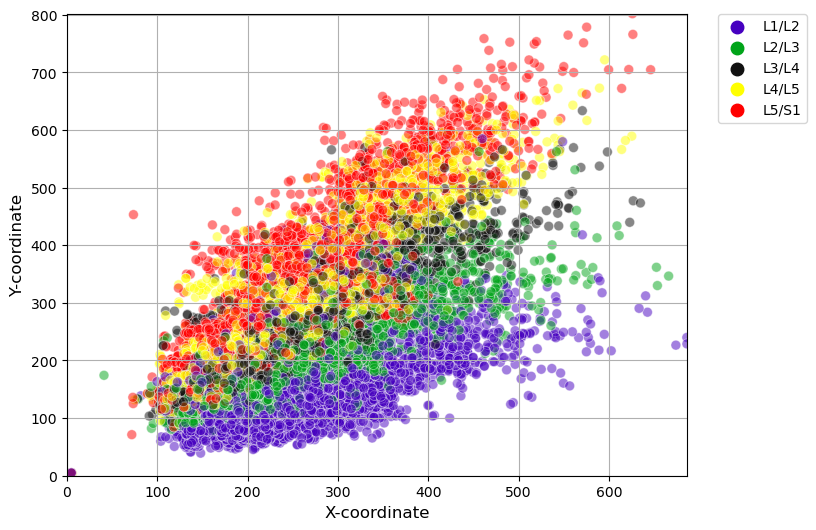

In [20]:
palette = ['#4600c0', '#00a419', '#111111', '#ffff00', '#ff0000']

def plot_scatter(df, x, y, hue, palette, marker_size=50, alpha=0.5, legend_pos=(1.05, 1), legend_loc='upper left'):

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df, x=x, y=y, hue=hue, palette=palette, s=marker_size, alpha=alpha)
    plt.legend(bbox_to_anchor=legend_pos, loc=legend_loc, borderaxespad=0., prop={'size': 10}, markerscale=1.5, framealpha=0.8)
    plt.grid(True)
    plt.xlim([0, df[x].max()])
    plt.ylim([0, df[y].max()])
    plt.xlabel('X-coordinate', fontsize=12)
    plt.ylabel('Y-coordinate', fontsize=12)
    plt.show()

plot_scatter(df_train, 'x', 'y', 'level', palette)




In [21]:
df_train.level.unique()
df_train.head(3)

,study_id,series_id,instance_number,condition,level,x,y,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,...,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1,series_description
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR


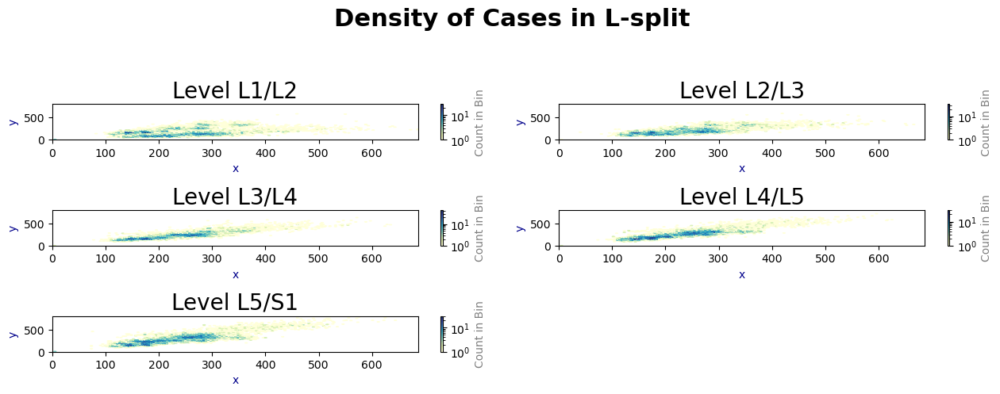

In [24]:
import math 
def plot_density(df, x, y, hue, gs=150, palette='YlGnBu', alpha=0.9):

    # Define parameters
    numerical_features = df[hue].unique()
    colorlabels = 'darkblue'
    Label_size = 10
    Title_size = 20
    figs_x = 13
    figs_y = 5

    # Calculate number of subplots
    n = len(numerical_features)
    n_cols = 2  # Number of columns for subplots
    n_rows = math.ceil(n / n_cols)  # Calculate number of rows needed

    # Create figure and subplots
    plt.figure(figsize=(figs_x, figs_y))
    plt.suptitle("Density of Cases in L-split", fontsize=Title_size+2, fontweight='bold', y=1.015)

    # Loop through numerical features
    for idx, feature in enumerate(numerical_features, start=1):
        # Filter data for the current feature
        d = df[df[hue] == feature]
        
        # Create subplot
        plt.subplot(n_rows, n_cols, idx)
        
        # Hexbin plot
        plt.hexbin(data=d, x=x, y=y, gridsize=gs, cmap=palette, bins='log', alpha=alpha)
        
        # Colorbar
        plt.colorbar().set_label(label='Count in Bin', size=10, color='grey')
        
        # Set axis labels and title
        plt.xlabel('x', fontsize=Label_size, color=colorlabels)
        plt.ylabel('y', fontsize=Label_size, color=colorlabels)
        plt.title(f'Level {feature}', color='black', fontsize=Title_size)
        
        # Set tick label size
        plt.tick_params(axis='both', labelsize=Label_size)
        
        # Set axis limits
        plt.xlim([0, df[x].max()])
        plt.ylim([0, df[y].max()])

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Show plot
    plt.show()

# Usage
plot_density(df_train, 'x', 'y', 'level')



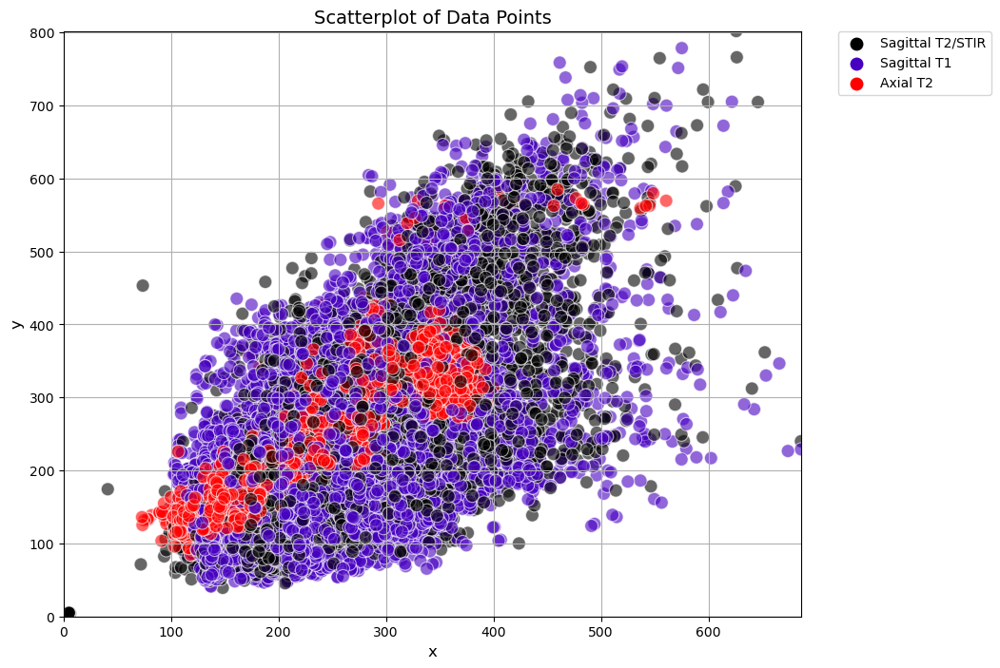

In [25]:

palette = ['#000000', '#4600c0', '#ff0000']

# Set figure size
figure_width = 10
figure_height = 8

plt.figure(figsize=(figure_width, figure_height))

# Plot the scatter plot
sns.scatterplot(data=df_train, x='x', y='y', hue='series_description', palette=palette, s=100, alpha=0.6)

# Customize legend
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., prop={'size': 10}, markerscale=1.5, framealpha=0.8, facecolor='white')

# Add grid lines
plt.grid(True)

# Set limits for x and y axes
plt.xlim([0, df_train.x.max()])
plt.ylim([0, df_train.y.max()])

# Set axis labels and title
plt.xlabel('x', fontsize=12)
plt.ylabel('y', fontsize=12)
plt.title('Scatterplot of Data Points', fontsize=14)

# Show the plot
plt.show()

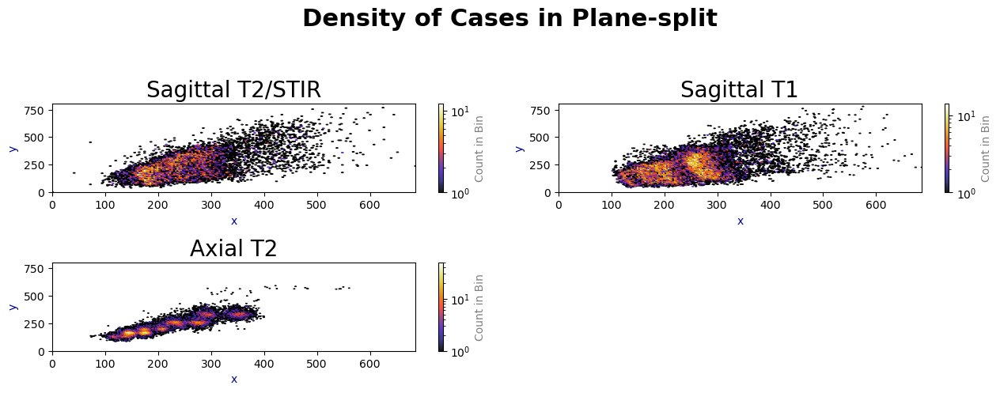

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Define parameters
numerical_features = df_train.series_description.unique()
gs = 200
colorlabels = 'darkblue'
Label_size = 10
Title_size = 20
figs_x = 13
figs_y = 5

# Calculate the number of subplots needed based on the number of numerical features
n = len(numerical_features)
n_cols = 2  # Number of columns for subplots
n_rows = math.ceil(n / n_cols)  # Calculate the number of rows needed

# Create figure and subplots
plt.figure(figsize=(figs_x, figs_y))
plt.suptitle("Density of Cases in Plane-split", fontsize=Title_size+2, fontweight='bold', y=1.015)

# Loop through numerical features
for idx, feature in enumerate(numerical_features, start=1):
    # Filter data for the current feature
    d = df_train[df_train.series_description == feature]
    
    # Create subplot
    plt.subplot(n_rows, n_cols, idx)
    
    # Hexbin plot
    plt.hexbin(data=d, x='x', y='y', gridsize=gs, cmap='CMRmap', bins='log', alpha=0.9)
    
    # Colorbar
    plt.colorbar().set_label(label='Count in Bin', size=10, color='grey')
    
    # Set axis labels and title
    plt.xlabel('x', fontsize=Label_size, color=colorlabels)
    plt.ylabel('y', fontsize=Label_size, color=colorlabels)
    plt.title(f'{feature}', color='black', fontsize=Title_size)
    
    # Set tick label size
    plt.tick_params(axis='both', labelsize=Label_size)
    
    # Set axis limits
    plt.xlim([0, df_train.x.max()])
    plt.ylim([0, df_train.y.max()])

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show plot
plt.show()

In [28]:
train_label_df = df_train_label.copy()
train_data_df = df_train_main.copy()


train_label_df['new_col'] = df_train_label['condition'].str.lower().str.replace(' ', '_') + '_' + df_train_label['level'].str.lower().str.replace('/', '_')

def get_target_value(row):
    study_id = row['study_id']
    new_col = row['new_col']
    return train_data_df.loc[train_data_df['study_id'] == study_id, new_col].values[0]


train_label_df['target'] = train_label_df.apply(get_target_value, axis=1)


train_label_df.drop(columns=['new_col'], inplace=True)


final_train_df = train_label_df.copy()


train_label_df.drop(columns=['target'], inplace=True)


final_train_df.head()

,study_id,series_id,instance_number,condition,level,x,y,target
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,Normal/Mild
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,Normal/Mild
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182,Normal/Mild
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434,Normal/Mild
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602,Normal/Mild


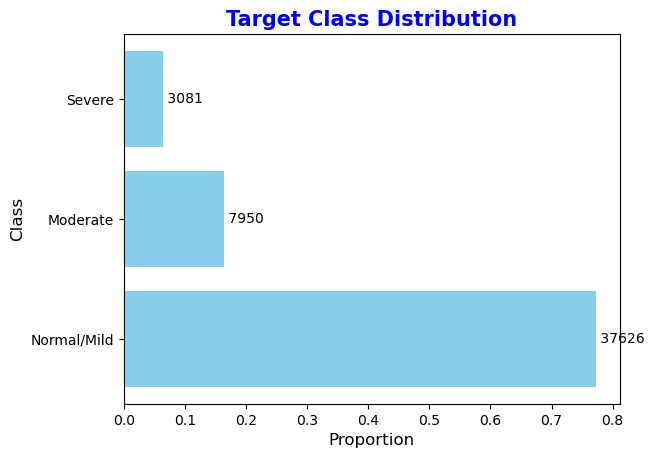

In [76]:
import matplotlib.pyplot as plt

# Sample data
name = ['Normal/Mild', 'Moderate', 'Severe']
bar_color = 'skyblue'  # New color for the bars

# Calculate the value counts of target classes
class_counts = final_train_df['target'].value_counts(normalize=False)
proportion_counts = final_train_df['target'].value_counts(normalize=True)

# Create the bar plot with the specified color
plt.barh(name, proportion_counts, color=bar_color)

# Add annotations to show the exact counts
for index, value in enumerate(class_counts):
    plt.text(proportion_counts[index], index, f' {value}', va='center', ha='left', color='black', fontsize=10)

# Add title and labels
plt.title('Target Class Distribution', color='blue', fontsize=15, fontweight='bold')
plt.xlabel('Proportion', fontsize=12)
plt.ylabel('Class', fontsize=12)

# Show the plot
plt.show()


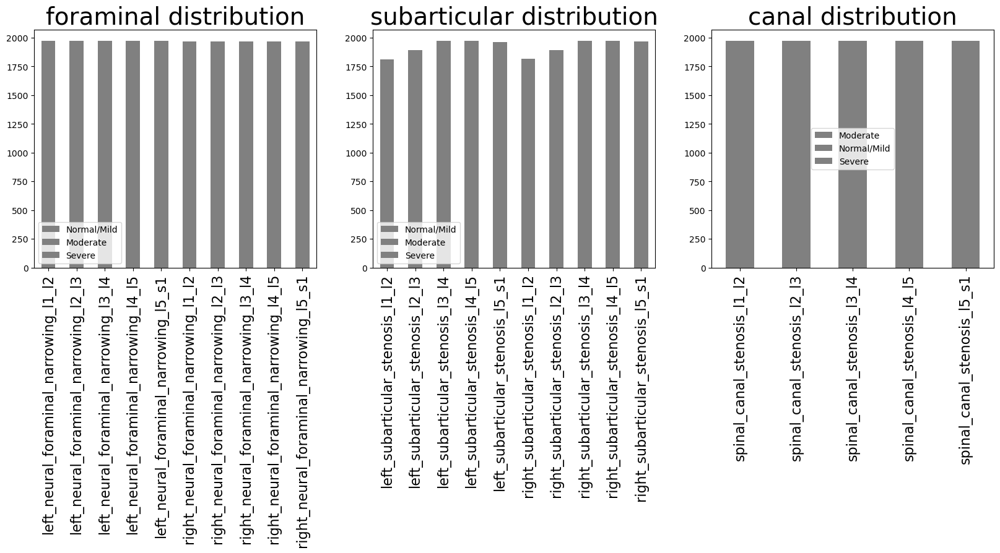

In [30]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Define color scheme
colours = {"male": "#273c75", "female": "#44bd32"}

# Iterate over the data categories
for idx, d in enumerate(['foraminal', 'subarticular', 'canal']):
    diagnosis = list(filter(lambda x: x.find(d) > -1, df_train_main.columns))
    dff = df_train_main[diagnosis]
    with warnings.catch_warnings():
        warnings.simplefilter(action="ignore", category=FutureWarning)
        value_counts = dff.apply(pd.value_counts).fillna(0).T

    # Plot the data with the specified color scheme
    value_counts.plot(kind='bar', stacked=True, ax=axes[idx], color=[colours.get(c, '#808080') for c in value_counts.columns])

    # Set tick label size
    axes[idx].tick_params(axis='x', labelsize=16) 
    
    # Set title
    axes[idx].set_title(f"{d} distribution", fontsize=28)

# Show the plot
plt.show()

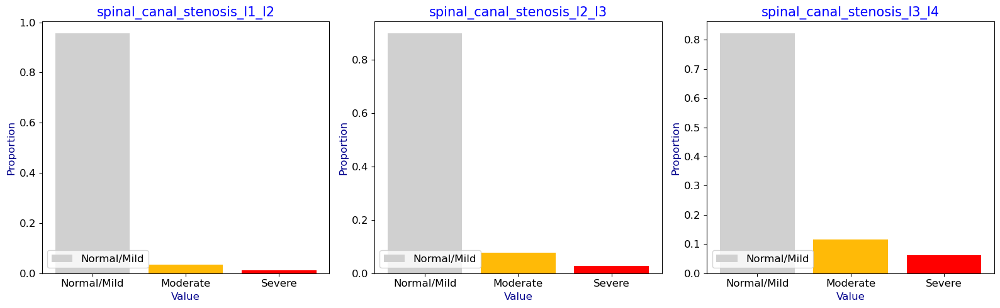

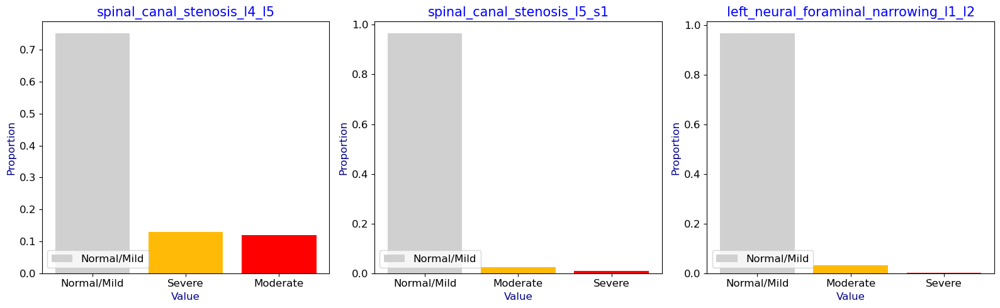

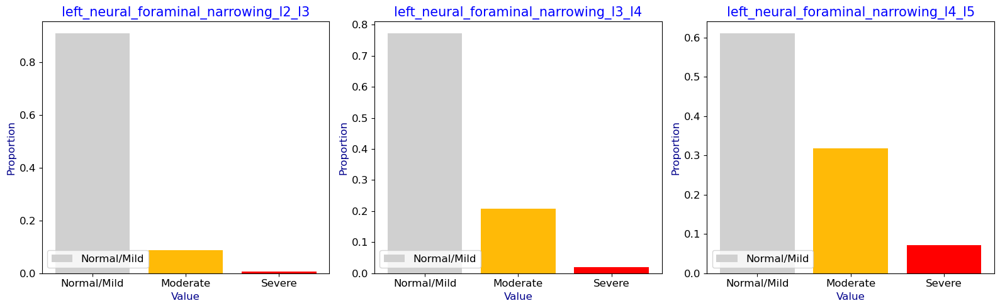

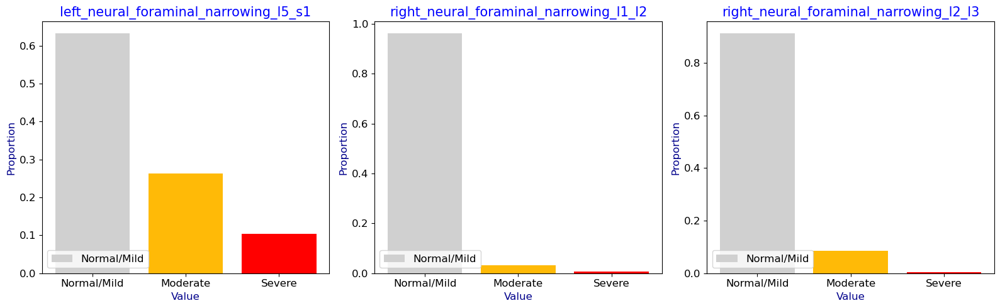

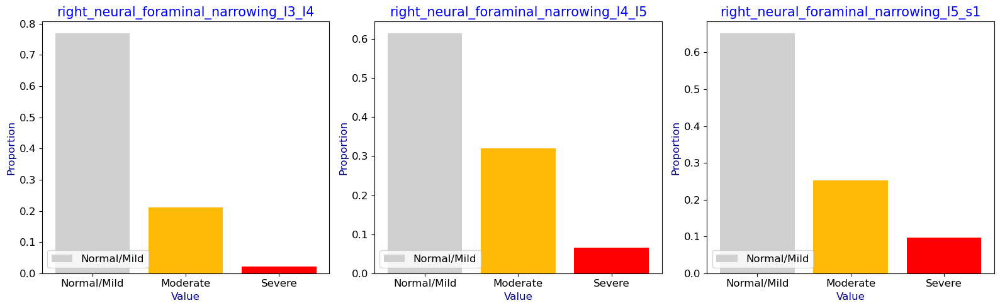

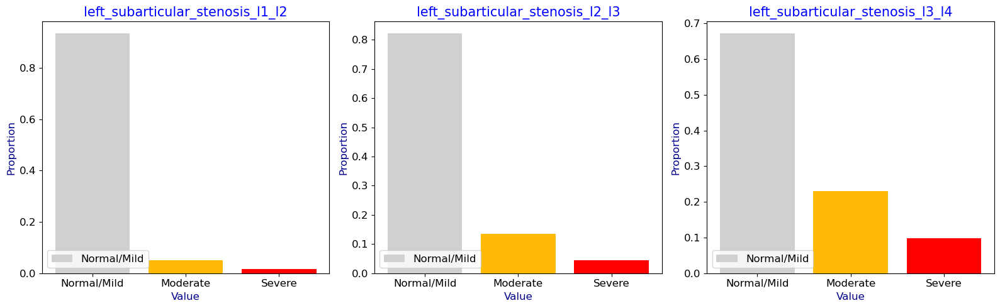

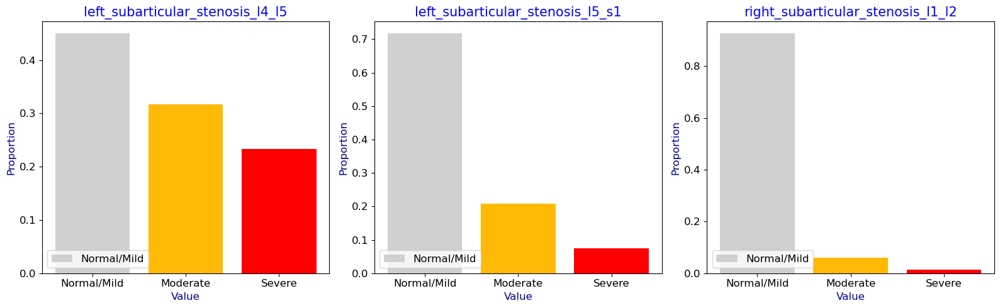

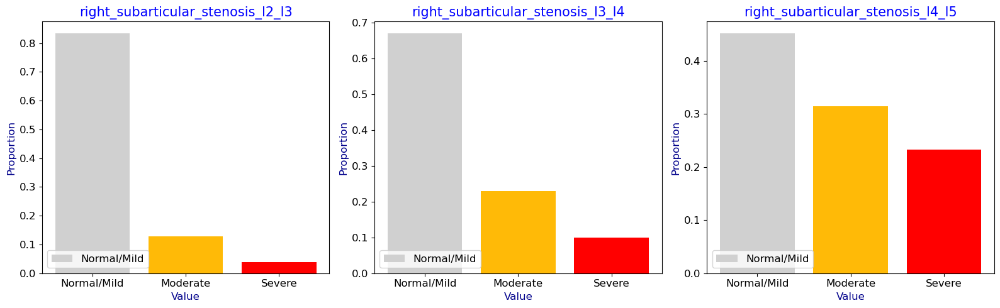

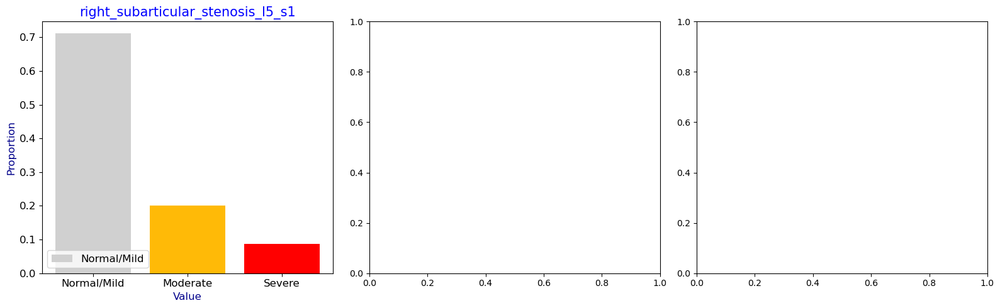

,study_id,series_id,instance_number,condition,level,x,y,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,...,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1,series_description
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR


In [31]:
p = ['#d0d0d0', '#ffba07', '#ff0000']
label = df_train_main.columns.drop('study_id').tolist()        
n = 3  # Number of columns
colorlabels = 'darkblue'
name = ['Normal/Mild', 'Moderate', 'Severe']

Label_size = 12 # Size font of xy labels
Title_size = 15 # Size font of Title
figs_x = 16
figs_y = 5

# Iterate over each feature
for i in range(0, len(label), n):
    fig, axes = plt.subplots(1, n, figsize=(figs_x, figs_y))
    for idx, feat in enumerate(label[i:i+n]):
        ax = axes[idx]
        feat_counts = df_train_main[feat].value_counts(normalize=True)
        ax.bar(feat_counts.index, feat_counts.values, color=sns.color_palette(p))
        ax.set_title(feat, color='blue', fontsize=Title_size)
        ax.set_xlabel('Value', fontsize=Label_size, color=colorlabels)
        ax.set_ylabel('Proportion', fontsize=Label_size, color=colorlabels)
        ax.tick_params(axis='both', labelsize=Label_size)
        ax.legend(name, loc='lower left', prop={'size': 12}, markerscale=3, framealpha=0.8, facecolor='white')
    plt.tight_layout()
    plt.show()


df_train.head(3)

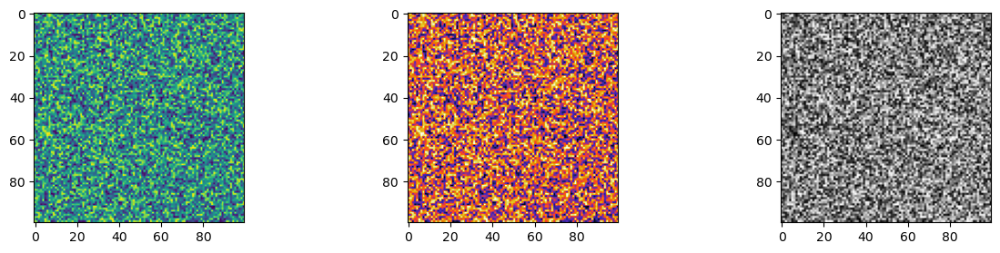

In [32]:
train_label_coordinates = df_train_label
train_label_coordinates[train_label_coordinates.study_id == 4003253]
rand_data = np.random.randint(0, 255, (100, 100))
rand_data


import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 3))

axes[0].imshow(rand_data, cmap='viridis')
axes[1].imshow(rand_data, cmap='CMRmap')
axes[2].imshow(rand_data, cmap='binary')

fig.show()

In [33]:
train_label_coordinates['series_description'] = df_train.series_description

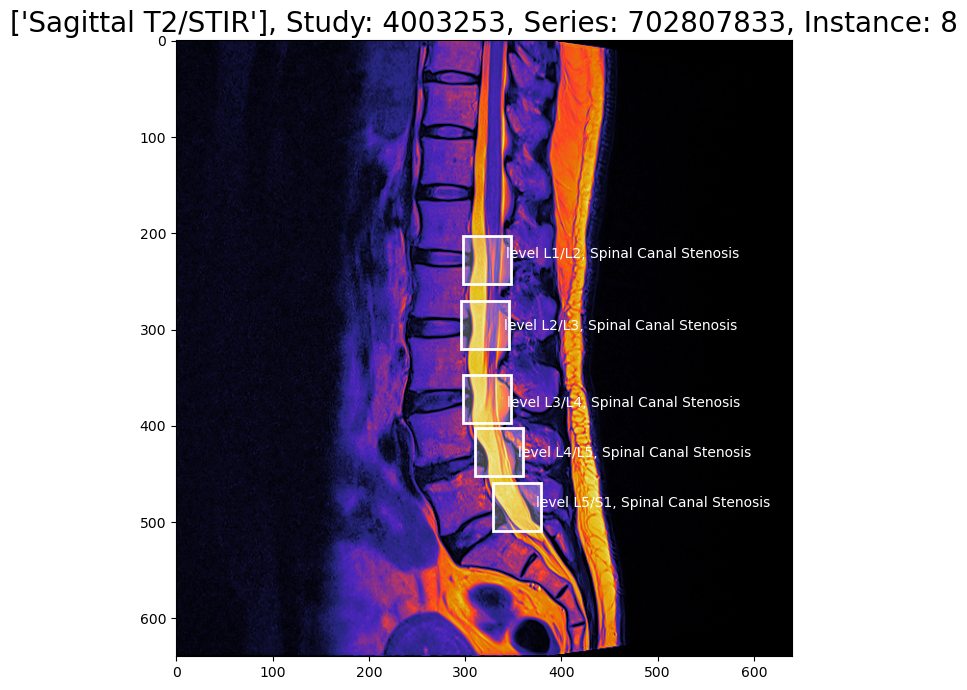

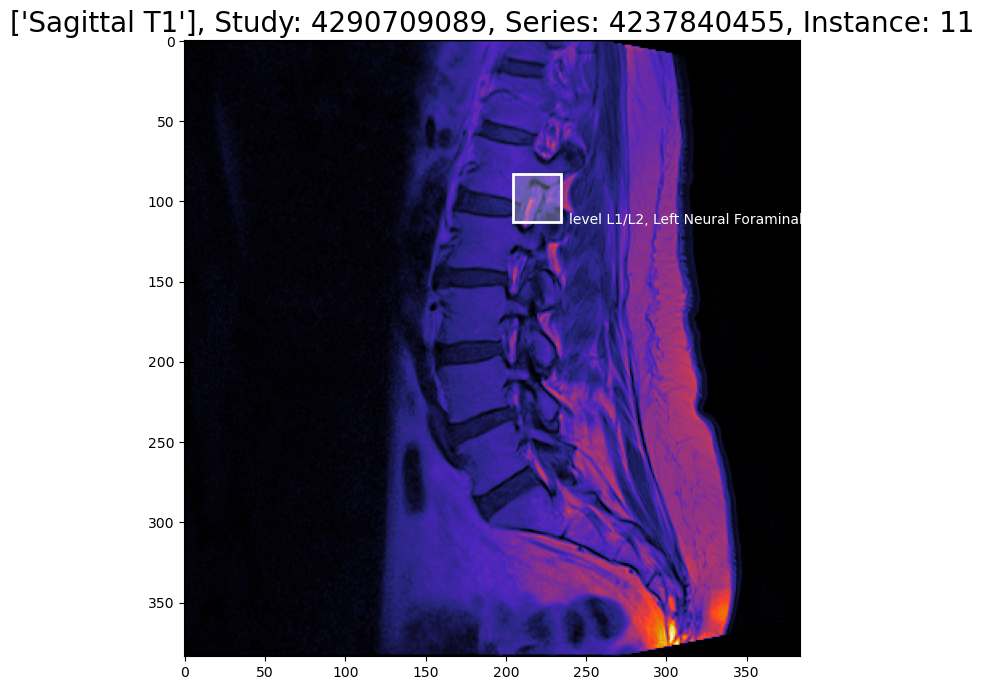

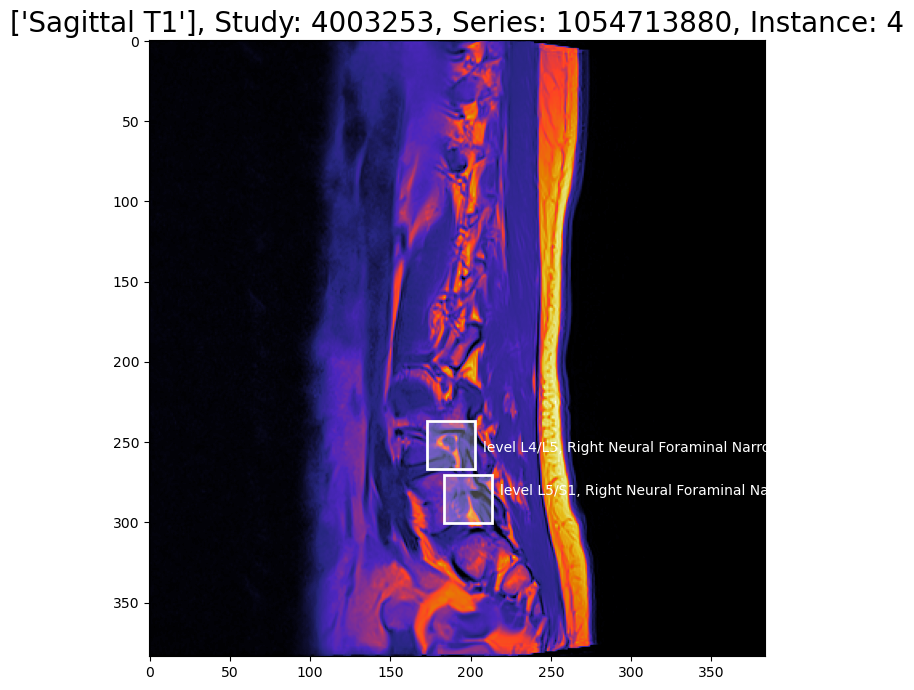

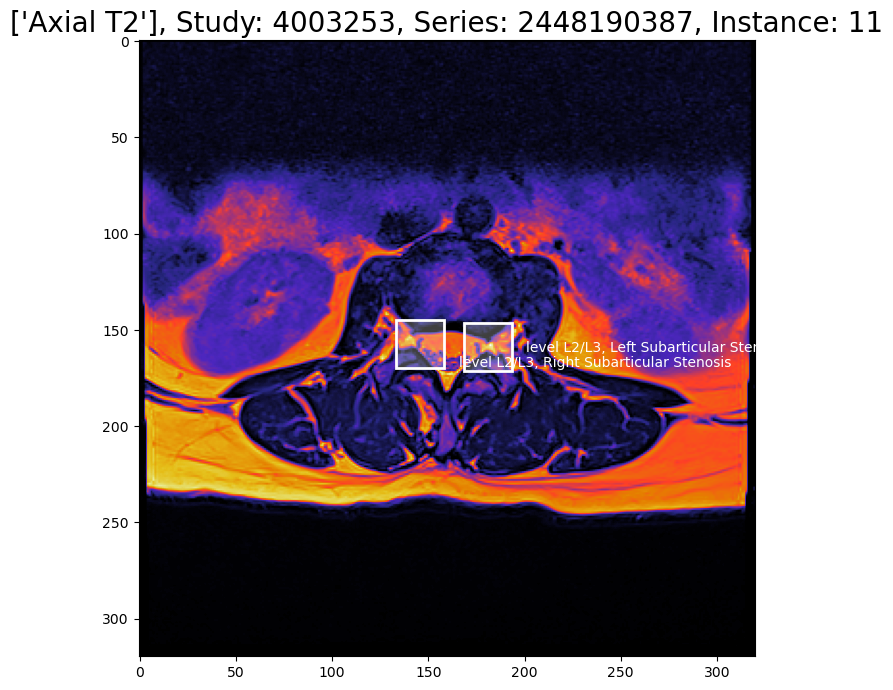

In [63]:
from matplotlib import patches
path = '/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/'


def mrt(id, ser, inst):
    lag=20
    path2 = path+'train_images/' + str(id) +'/' + str(ser)+'/' + str(inst) + '.dcm'

    ds = dicom.dcmread(path2)
    fig, ax = plt.subplots(figsize=(16, 8))
    from matplotlib.colors import LogNorm 

    ax.imshow(ds.pixel_array, cmap ='CMRmap')     # Display the image

    # Create a legend
    legend_elements = []

    # Plot the coordinates for the current condition
    ab = train_label_coordinates[(train_label_coordinates.study_id==id) & 
                                          (train_label_coordinates.instance_number==inst)&
                                         (train_label_coordinates.series_id==ser)]

    a = 25 * max(ds.pixel_array.shape)/640
    for _, row in ab.iterrows():
        x, y = row['x'], row['y']

        rect2 = patches.Rectangle((x - a, y - a), 2*a, 2*a, linewidth=2, edgecolor='white', facecolor='none')
        rect1 = patches.Rectangle((x - a, y - a), 2*a, 2*a, linewidth=2, facecolor='white', alpha = 0.25)

        ax.add_patch(rect2)
        ax.add_patch(rect1)

        # Add the condition to the legend
        legend_elements.append(patches.Patch(facecolor='none', edgecolor='r', ))

    # Add title
    title = f"{ab.series_description.unique()}, Study: {id}, Series: {ser}, Instance: {inst}"
    ax.set_title(title, fontsize=20)

    # Display additional columns:
    for _, row in ab.iterrows():
        text = f"level {row['level']}, {row['condition']}"
        ax.text(row['x'] + lag, row['y']+np.random.randint(-15, 15), text, fontsize=10, color='white', verticalalignment='center_baseline')
    
    plt.show() 
    #Case #1
id = 4003253
ser= 702807833
inst=8

mrt(id, ser, inst)
#Case #2
id = 4290709089
ser= 4237840455
inst=11

mrt(id, ser, inst)
#Case #3
id = 4003253
ser= 1054713880
inst=4

mrt(id, ser, inst)
#Case #4
id = 4003253
ser= 2448190387
inst=11

mrt(id, ser, inst)

In [36]:


import os
import glob
import pydicom
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import rc

def MR3d(id, ser, path):
    path_to_folder = os.path.join(path, f"train_images/{id}/{ser}")

    def load_dicom_line(path):
        t_paths = sorted(
            glob.glob(os.path.join(path, "*")), 
            key=lambda x: int(os.path.splitext(os.path.basename(x))[0].split("-")[-1]),
        )
        images = []
        for filename in t_paths:
            ds = pydicom.dcmread(filename)
            data = ds.pixel_array
            data = data - np.min(data)
            if np.max(data) != 0:
                data = data / np.max(data)
            data = (data * 255).astype(np.uint8)
            images.append(data)
        return images

    def create_animation(ims):
        fig = plt.figure(figsize=(6, 6))
        plt.axis('off')
        im = plt.imshow(ims[0], cmap="CMRmap")
        text = plt.text(0.05, 0.05, f'Slide {1}', transform=fig.transFigure, fontsize=16, color='darkblue')

        def animate_func(i):
            im.set_array(ims[i])
            text.set_text(f'Slide {i+1}')  
            return [im]

        plt.title(f'id = {id}, series = {ser}')
        plt.close()  

        return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//10)

    images = load_dicom_line(path_to_folder)
    
    return create_animation(images)

# Example usage:
animation = MR3d(4003253, 702807833, path)

HTML(animation.to_jshtml())





In [39]:

import sklearn.metrics

class ParticipantVisibleError(Exception):
    pass

def get_condition(full_location: str) -> str:
    """Extracts the injury condition from the full location string."""
    conditions = ['spinal', 'foraminal', 'subarticular']
    for condition in conditions:
        if condition in full_location:
            return condition
    raise ValueError(f'Condition not found in {full_location}')

In [40]:
def score(solution: pd.DataFrame, submission: pd.DataFrame, row_id_column_name: str, any_severe_scalar: float) -> float:
    """
    Calculates the weighted log loss for each medical condition and returns the average score.

    Args:
    - solution: DataFrame containing the ground truth labels and sample weights.
    - submission: DataFrame containing the predicted labels.
    - row_id_column_name: Name of the column containing row IDs.
    - any_severe_scalar: Weight scalar for any severe label.

    Returns:
    - Average score calculated from the weighted log loss of each condition.
    """
    target_levels = ['normal_mild', 'moderate', 'severe']

    # Basic QC checks
    for df in [solution, submission]:
        if not all(isinstance(df[col].dtype, (int, float)) for col in target_levels):
            raise ParticipantVisibleError('All submission values must be numeric')
        if not np.isfinite(df[target_levels].values).all():
            raise ParticipantVisibleError('All submission values must be finite')
        if df[target_levels].min().min() < 0:
            raise ParticipantVisibleError('All labels and predictions must be non-negative')

    # Preprocess solution and submission DataFrames
    solution['study_id'] = solution[row_id_column_name].str.split('_').str[0]
    solution['condition'] = solution[row_id_column_name].apply(get_condition)
    del solution[row_id_column_name]
    del submission[row_id_column_name]

    submission['study_id'] = solution['study_id']
    submission['condition'] = solution['condition']

    # Calculate log loss for each condition
    condition_losses = []
    condition_weights = []
    for condition in ['spinal', 'foraminal', 'subarticular']:
        condition_indices = solution[solution['condition'] == condition].index
        loss = sklearn.metrics.log_loss(
            y_true=solution.loc[condition_indices, target_levels],
            y_pred=submission.loc[condition_indices, target_levels],
            sample_weight=solution.loc[condition_indices, 'sample_weight']
        )
        condition_losses.append(loss)
        condition_weights.append(1 / solution.loc[condition_indices, 'study_id'].nunique())

    # Calculate log loss for any severe label in spinal condition
    spinal_indices = solution[solution['condition'] == 'spinal'].index
    any_severe_loss = sklearn.metrics.log_loss(
        y_true=solution.loc[spinal_indices, 'severe'],
        y_pred=submission.loc[spinal_indices, 'severe'],
        sample_weight=solution.loc[spinal_indices, 'sample_weight']
    )
    condition_losses.append(any_severe_loss)
    condition_weights.append(any_severe_scalar)

    # Calculate weighted average of log losses
    return np.average(condition_losses, weights=condition_weights)




In [44]:
df_test_desc

,study_id,series_id,series_description
0,44036939,2828203845,Sagittal T1
1,44036939,3481971518,Axial T2
2,44036939,3844393089,Sagittal T2/STIR


In [45]:
df_sub.head(5)


,row_id,normal_mild,moderate,severe
0,44036939_left_neural_foraminal_narrowing_l1_l2,0.333333,0.333333,0.333333
1,44036939_left_neural_foraminal_narrowing_l2_l3,0.333333,0.333333,0.333333
2,44036939_left_neural_foraminal_narrowing_l3_l4,0.333333,0.333333,0.333333
3,44036939_left_neural_foraminal_narrowing_l4_l5,0.333333,0.333333,0.333333
4,44036939_left_neural_foraminal_narrowing_l5_s1,0.333333,0.333333,0.333333


In [46]:
df_train_main.head(3)

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1,4646740,Normal/Mild,Normal/Mild,Moderate,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate,Normal/Mild
2,7143189,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild


In [47]:


# Create df_unpivoted DataFrame
df_unpivoted = df_train_main.melt(id_vars='study_id', var_name='condition', value_name='status')

# Display the modified DataFrame
df_unpivoted.head()



,study_id,condition,status
0,4003253,spinal_canal_stenosis_l1_l2,Normal/Mild
1,4646740,spinal_canal_stenosis_l1_l2,Normal/Mild
2,7143189,spinal_canal_stenosis_l1_l2,Normal/Mild
3,8785691,spinal_canal_stenosis_l1_l2,Normal/Mild
4,10728036,spinal_canal_stenosis_l1_l2,Normal/Mild


In [48]:

# Filter df_unpivoted for a specific study_id (e.g., 4003253)
df_unpivoted_filtered = df_unpivoted[df_unpivoted['study_id'] == 4003253]

# Display the modified DataFrame
print(df_unpivoted_filtered)


       study_id                               condition       status
0       4003253             spinal_canal_stenosis_l1_l2  Normal/Mild
1975    4003253             spinal_canal_stenosis_l2_l3  Normal/Mild
3950    4003253             spinal_canal_stenosis_l3_l4  Normal/Mild
5925    4003253             spinal_canal_stenosis_l4_l5  Normal/Mild
7900    4003253             spinal_canal_stenosis_l5_s1  Normal/Mild
9875    4003253   left_neural_foraminal_narrowing_l1_l2  Normal/Mild
11850   4003253   left_neural_foraminal_narrowing_l2_l3  Normal/Mild
13825   4003253   left_neural_foraminal_narrowing_l3_l4  Normal/Mild
15800   4003253   left_neural_foraminal_narrowing_l4_l5     Moderate
17775   4003253   left_neural_foraminal_narrowing_l5_s1  Normal/Mild
19750   4003253  right_neural_foraminal_narrowing_l1_l2  Normal/Mild
21725   4003253  right_neural_foraminal_narrowing_l2_l3  Normal/Mild
23700   4003253  right_neural_foraminal_narrowing_l3_l4     Moderate
25675   4003253  right_neural_fora

In [49]:
# Group by 'condition' and 'status' columns, calculate normalized value counts, and reshape the table
frequency_table = df_unpivoted.groupby('condition')['status'].value_counts(normalize=True).unstack(fill_value=0)

# Reset the index to move 'condition' into columns
frequency_table = frequency_table.reset_index()

# Rename columns to match the expected format
frequency_table.rename(columns={'Normal/Mild': 'normal_mild', 'Moderate': 'moderate', 'Severe': 'severe'}, inplace=True)

# Round all values in the DataFrame to 2 decimal places
frequency_table = frequency_table.round(2)

# Display the modified DataFrame
print(frequency_table)

status                               condition  moderate  normal_mild  severe
0        left_neural_foraminal_narrowing_l1_l2      0.03         0.97    0.00
1        left_neural_foraminal_narrowing_l2_l3      0.09         0.91    0.01
2        left_neural_foraminal_narrowing_l3_l4      0.21         0.77    0.02
3        left_neural_foraminal_narrowing_l4_l5      0.32         0.61    0.07
4        left_neural_foraminal_narrowing_l5_s1      0.26         0.63    0.10
5             left_subarticular_stenosis_l1_l2      0.05         0.93    0.02
6             left_subarticular_stenosis_l2_l3      0.13         0.82    0.04
7             left_subarticular_stenosis_l3_l4      0.23         0.67    0.10
8             left_subarticular_stenosis_l4_l5      0.32         0.45    0.23
9             left_subarticular_stenosis_l5_s1      0.21         0.72    0.07
10      right_neural_foraminal_narrowing_l1_l2      0.03         0.96    0.01
11      right_neural_foraminal_narrowing_l2_l3      0.09        

In [50]:

data = {
    'row_id': ['item1_conditionA', 'item2_conditionB', 'item3_conditionC'],
    'value1': [1.234, 2.345, 3.456],
    'value2': [4.567, 5.678, 6.789]
}

# Create the DataFrame
df_submission = pd.DataFrame(data)

# Extract the condition from the row_id column
df_submission['condition'] = df_submission['row_id'].str.extract(r'_(.*)')

# Round all values in the DataFrame to 2 decimal places
df_submission = df_submission.round(2)

# Display the modified DataFrame
print(df_submission)




             row_id  value1  value2   condition
0  item1_conditionA    1.23    4.57  conditionA
1  item2_conditionB    2.35    5.68  conditionB
2  item3_conditionC    3.46    6.79  conditionC


In [51]:
df_train


,study_id,series_id,instance_number,condition,level,x,y,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,...,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1,series_description
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T2/STIR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48687,4290709089,4237840455,11,Left Neural Foraminal Narrowing,L1/L2,219.465940,97.831063,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T1
48688,4290709089,4237840455,12,Left Neural Foraminal Narrowing,L2/L3,205.340599,140.207084,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T1
48689,4290709089,4237840455,12,Left Neural Foraminal Narrowing,L3/L4,202.724796,181.013624,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T1
48690,4290709089,4237840455,12,Left Neural Foraminal Narrowing,L4/L5,202.933333,219.733333,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Sagittal T1


In [52]:
test_images_dir = "/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/test_images"

# Get all unique IDs from the filenames in the test images directory
test_ids = [4003252, 4003253]  # temporary, for debugging
unique_ids = list(set(test_ids))

conditions = ['left_neural_foraminal_narrowing_l1_l2',
              'left_neural_foraminal_narrowing_l2_l3',
              'left_neural_foraminal_narrowing_l3_l4',
              'left_neural_foraminal_narrowing_l4_l5',
              'left_neural_foraminal_narrowing_l5_s1',
              'left_subarticular_stenosis_l1_l2',
              'left_subarticular_stenosis_l2_l3',
              'left_subarticular_stenosis_l3_l4',
              'left_subarticular_stenosis_l4_l5',
              'left_subarticular_stenosis_l5_s1',
              'right_neural_foraminal_narrowing_l1_l2',
              'right_neural_foraminal_narrowing_l2_l3',
              'right_neural_foraminal_narrowing_l3_l4',
              'right_neural_foraminal_narrowing_l4_l5',
              'right_neural_foraminal_narrowing_l5_s1',
              'right_subarticular_stenosis_l1_l2',
              'right_subarticular_stenosis_l2_l3',
              'right_subarticular_stenosis_l3_l4',
              'right_subarticular_stenosis_l4_l5',
              'right_subarticular_stenosis_l5_s1',
              'spinal_canal_stenosis_l1_l2',
              'spinal_canal_stenosis_l2_l3',
              'spinal_canal_stenosis_l3_l4',
              'spinal_canal_stenosis_l4_l5',
              'spinal_canal_stenosis_l5_s1']

row_ids = [f"{id}_{condition}" for id in unique_ids for condition in conditions]

# Create DataFrame
df_submission = pd.DataFrame(row_ids, columns=['row_id'])

# Set the observed frequencies for each condition
observed_frequencies = {
    'normal_mild': 0.4242,
    'moderate': 0.3031,
    'severe': 0.2727
}

# Assign observed frequencies to submission DataFrame
for col, freq in observed_frequencies.items():
    df_submission[col] = freq

# Display the submission DataFrame
df_submission.head()

,row_id,normal_mild,moderate,severe
0,4003252_left_neural_foraminal_narrowing_l1_l2,0.4242,0.3031,0.2727
1,4003252_left_neural_foraminal_narrowing_l2_l3,0.4242,0.3031,0.2727
2,4003252_left_neural_foraminal_narrowing_l3_l4,0.4242,0.3031,0.2727
3,4003252_left_neural_foraminal_narrowing_l4_l5,0.4242,0.3031,0.2727
4,4003252_left_neural_foraminal_narrowing_l5_s1,0.4242,0.3031,0.2727


In [55]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Load data
test_series = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/test_series_descriptions.csv')
df_train = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/train.csv')

# Preprocess training data
df_train_melted = df_train.melt(id_vars=['study_id'], var_name='condition_level', value_name='severity')
df_train_melted[['condition', 'level']] = df_train_melted['condition_level'].str.rsplit('_', n=2, expand=True).iloc[:, 1:]

le_severity = LabelEncoder()
df_train_melted['severity_encoded'] = le_severity.fit_transform(df_train_melted['severity'])

X_train = df_train_melted[['study_id', 'condition', 'level']]
y_train = df_train_melted['severity_encoded']

X_train = pd.get_dummies(X_train, columns=['condition', 'level'])

# Preprocess test data
test_rows = []
for _, row in test_series.iterrows():
    for condition in ['left_neural_foraminal_narrowing', 'right_neural_foraminal_narrowing', 'left_subarticular_stenosis', 'right_subarticular_stenosis', 'spinal_canal_stenosis']:
        for level in ['l1_l2', 'l2_l3', 'l3_l4', 'l4_l5', 'l5_s1']:
            test_rows.append({
                'study_id': row['study_id'],
                'condition': condition,
                'level': level
            })



In [56]:
X_test = pd.DataFrame(test_rows)
X_test = pd.get_dummies(X_test, columns=['condition', 'level'])
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# Split the data into train and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Hyperparameter Tuning
params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001]
}

grid_search = GridSearchCV(estimator=XGBClassifier(), param_grid=params, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

# Train the model with the best hyperparameters


In [77]:
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
import xgboost as xgb
from sklearn.svm import SVC

# Define the models
models = {
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, random_state=42),
    "XGBoost": xgb.XGBClassifier(objective='multi:softprob', random_state=42),
    "Support Vector Machine": SVC(probability=True, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
}

# Train and evaluate models
for model_name, model in models.items():
    print(f"{'='*40}")
    print(f"Training and Evaluating {model_name}")
    print(f"{'='*40}\n")
    
    # Train the model
    model.fit(X_train, y_train)
    
    # Evaluate the model on the validation set
    y_pred = model.predict(X_valid)
    accuracy = accuracy_score(y_valid, y_pred)
    print(f"Accuracy on Validation Set: {accuracy:.4f}\n")
    
    # Cross-Validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5)
    mean_cv_accuracy = cv_scores.mean()
    print(f"Cross-Validation Scores: {cv_scores}")
    print(f"Mean CV Accuracy: {mean_cv_accuracy:.4f}\n")
    
    # Classification Report
    class_report = classification_report(y_valid, y_pred, target_names=["Class 0", "Class 1", "Class 2", "Class 3"])
    print("Classification Report:")
    print(class_report)
    print("\n")




Training and Evaluating Gradient Boosting

Accuracy on Validation Set: 0.7593

Cross-Validation Scores: [0.7678481  0.76620253 0.76607595 0.76594937 0.76607595]
Mean CV Accuracy: 0.7664

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.41      0.01      0.02      1633
     Class 1       0.76      1.00      0.86      7487
     Class 2       0.83      0.01      0.02       644
     Class 3       0.14      0.01      0.02       111

    accuracy                           0.76      9875
   macro avg       0.54      0.26      0.23      9875
weighted avg       0.70      0.76      0.66      9875



Training and Evaluating XGBoost

Accuracy on Validation Set: 0.7570

Cross-Validation Scores: [0.7635443  0.76278481 0.76481013 0.76468354 0.76594937]
Mean CV Accuracy: 0.7644

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.29      0.01      0.01      1633
     Class 1       0.76      1.00      0.86 

In [58]:
X_train

,study_id,condition_l1,condition_l2,condition_l3,condition_l4,condition_l5,level_l2,level_l3,level_l4,level_l5,level_s1
475,1047914296,True,False,False,False,False,True,False,False,False,False
36326,1722308532,False,False,False,True,False,False,False,False,True,False
30305,1504981676,True,False,False,False,False,True,False,False,False,False
19568,3887124538,False,False,False,False,True,False,False,False,False,True
1467,3201135301,True,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
11284,3074721194,True,False,False,False,False,True,False,False,False,False
44732,2797118205,False,False,True,False,False,False,False,True,False,False
38158,1406775031,False,False,False,False,True,False,False,False,False,True
860,1897045431,True,False,False,False,False,True,False,False,False,False


In [59]:
from xgboost import XGBClassifier

# Instantiate the XGBClassifier model with a random_state for reproducibility
model = XGBClassifier(random_state=1)

# Fit the model to the training data
model.fit(X_train, y_train)

# Display the instantiated XGBClassifier model
print(model)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)


In [66]:
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier

# Instantiate the XGBClassifier model with a random_state for reproducibility
model = XGBClassifier(random_state=1)

# Fit the model to the training data
model.fit(X_train, y_train)

# Predict on the validation set
y_pred = model.predict(X_valid)

# Calculate accuracy
accuracy = accuracy_score(y_valid, y_pred)
print("Accuracy:", accuracy)

# Perform cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Accuracy:", cv_scores.mean())

# Print classification report
print("Classification Report:")
print(classification_report(y_valid, y_pred))


Accuracy: 0.7569620253164557
Cross-Validation Scores: [0.7635443  0.76278481 0.76481013 0.76468354 0.76594937]
Mean CV Accuracy: 0.7643544303797467
Classification Report:
              precision    recall  f1-score   support

           0       0.29      0.01      0.01      1633
           1       0.76      1.00      0.86      7487
           2       0.00      0.00      0.00       644
           3       0.00      0.00      0.00       111

    accuracy                           0.76      9875
   macro avg       0.26      0.25      0.22      9875
weighted avg       0.62      0.76      0.66      9875



In [61]:
predictions_proba = model.predict_proba(X_test)
predictions_df = pd.DataFrame(predictions_proba, columns=le_severity.classes_)
predictions_df['study_id'] = X_test['study_id'].values
predictions_df['condition_level'] = X_test.index.map(lambda idx: f"{test_rows[idx]['condition']}_{test_rows[idx]['level']}")
predictions_df['row_id'] = predictions_df['study_id'].astype(str) + '_' + predictions_df['condition_level']
df_sub1 = pd.read_csv('/Users/devnikhil/Documents/med/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')

df_submission.to_csv('submission.csv', index=False)

normal_mild_value = predictions_df['Normal/Mild'].iloc[0]
moderate_value = predictions_df['Moderate'].iloc[0]
severe_value = predictions_df['Severe'].iloc[0]


df_sub['normal_mild'] = normal_mild_value/2
df_sub['moderate'] =moderate_value*2
df_sub['severe'] = 1-(normal_mild_value/2 +moderate_value*2)- severe_value


normal_mild_value = 0.36
moderate_value = 0.426666667
severe_value = 0.213333333

df_sub['normal_mild'] = normal_mild_value
df_sub['moderate']    = moderate_value
df_sub['severe']      = severe_value

In [62]:
df_sub.sample(4)


,row_id,normal_mild,moderate,severe
15,44036939_right_subarticular_stenosis_l1_l2,0.36,0.426667,0.213333
21,44036939_spinal_canal_stenosis_l2_l3,0.36,0.426667,0.213333
13,44036939_right_neural_foraminal_narrowing_l4_l5,0.36,0.426667,0.213333
23,44036939_spinal_canal_stenosis_l4_l5,0.36,0.426667,0.213333
